In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# 封装DoubleConv for UNet
class DoubleConv(nn.Module):
    
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()

        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.double_conv(x)

class DownSample(nn.Module):
    
    def __init__(self, in_channels, out_channels):
        super(DownSample, self).__init__()

        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(kernel_size=2, stride=2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)

class UpSample(nn.Module):
    
    def __init__(self, in_channels, out_channels):
        super(UpSample, self).__init__()

        self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        dx = torch.tensor([x2.size(3) - x1.size(3)])
        dy = torch.tensor([x2.size(2) - x1.size(2)])

        x1 = F.pad(x1, [dx // 2, dx - dx // 2,
                        dy // 2, dy - dy // 2])
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class OutConv(nn.Module):

    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

# 将上面子模块拼成完整的UNet类
# UNet进行了4次下采样, 4次上采样
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes):
        super(UNet, self).__init__()

        self.n_channels = n_channels
        self.n_classes = n_classes
        
        # x: [batch_size*channels*w*h] 2*1*512*512
        self.input = DoubleConv(n_channels, 64) # 2*64*508*508
        self.downsample1 = DownSample(64, 128)
        self.downsample2 = DownSample(128, 256)
        self.downsample3 = DownSample(256, 512)
        self.downsample4 = DownSample(512, 1024)
        self.upsample1 = UpSample(1024, 512)
        self.upsample2 = UpSample(512, 256)
        self.upsample3 = UpSample(256, 128)
        self.upsample4 = UpSample(128, 64)
        self.output = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.input(x)
        x2 = self.downsample1(x1)
        x3 = self.downsample2(x2)
        x4 = self.downsample3(x3)
        x5 = self.downsample4(x4)
        x = self.upsample1(x5, x4)
        x = self.upsample2(x, x3)
        x = self.upsample3(x, x2)
        x = self.upsample4(x, x1)
        pred = self.output(x)
        return pred

In [2]:
model = UNet(n_channels=3, n_classes=2)
print(model)

UNet(
  (input): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (downsample1): DownSample(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2d(128, eps

In [4]:
# 组织dataset
import cv2
import os, glob
import random
from torch.utils.data import Dataset

class ISBIDataset(Dataset):
    def __init__(self, dataPath):
        self.dataPath = dataPath
        self.imagesPath = glob.glob(os.path.join(dataPath, 'image/*.png'))
        
    def augment(self, image, flipMode):
        flipImg = cv2.flip(image, flipMode)
        return flipImg
    
    def __getitem__(self, idx):
        imagePath = self.imagesPath[idx]
        labelPath = imagePath.replace('image', 'label')
        image = cv2.imread(imagePath)
        label = cv2.imread(labelPath)
        
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        label = cv2.cvtColor(label, cv2.COLOR_BGR2GRAY)
        image = image.reshape(1, image.shape[0], image.shape[1])
        label = label.reshape(1, label.shape[0], label.shape[1])
        
        if label.max() > 1:
            label = label / 255
        flipMode = random.choice([-1, 0, 1, 2])
        if flipMode != 2:
            image = self.augment(image, flipMode)
            label = self.augment(label, flipMode)
        return image, label
    
    def __len__(self):
        return len(self.imagesPath)

In [5]:
isbi_dataset = ISBIDataset("data/train")
len(isbi_dataset)

30

In [6]:
train_loader = torch.utils.data.DataLoader(dataset=isbi_dataset,
                                          batch_size=2,
                                          shuffle=True)
img, lab = iter(train_loader).next()
img.shape, lab.shape

(torch.Size([2, 1, 512, 512]), torch.Size([2, 1, 512, 512]))

In [ ]:
# train UNet
from torch import optim

def train_model(model, dataPath, epochs=40, batch_size=2, lr=1e-5):
    optimizer = optim.RMSprop(model.parameters(), lr=lr, weight_decay=1e-8, momentum=0.9)
    loss_fn = nn.BCEWithLogitsLoss()
    bestLoss = float('inf')
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    
    for epoch in range(epochs):
        model.train()
        
        for i, (image, label) in enumerate(train_loader):
            image, label = image.float().to(device), label.to(device)
            
            pred = model(image)
            loss = loss_fn(pred, label)
            print("epoch: ", epoch, "iteration: ", i, "loss: ", loss.item())
            if loss < bestLoss:
                bestLoss = loss
                torch.save(model.state_dict(), "best_model.pth")
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

model = UNet(n_channels=1, n_classes=1)
train_model(model, dataPath="data/train/")

epoch:  0 iteration:  0 loss:  0.7602031725283993
epoch:  0 iteration:  1 loss:  0.7152157695800625
epoch:  0 iteration:  2 loss:  0.6470961572699494
epoch:  0 iteration:  3 loss:  0.6027621473476508
epoch:  0 iteration:  4 loss:  0.6266340575334546
epoch:  0 iteration:  5 loss:  0.5835233698683151
epoch:  0 iteration:  6 loss:  0.5789025350089578
epoch:  0 iteration:  7 loss:  0.5426653914261403
epoch:  0 iteration:  8 loss:  0.5062007832590844
epoch:  0 iteration:  9 loss:  0.49646421491153714
epoch:  0 iteration:  10 loss:  0.5131549339623251
epoch:  0 iteration:  11 loss:  0.4648556225944059
epoch:  0 iteration:  12 loss:  0.5072157559382064
epoch:  0 iteration:  13 loss:  0.48198391144714536
epoch:  0 iteration:  14 loss:  0.4781165394762489
epoch:  1 iteration:  0 loss:  0.4518021628843817
epoch:  1 iteration:  1 loss:  0.44404901223275234
epoch:  1 iteration:  2 loss:  0.42638520118689305
epoch:  1 iteration:  3 loss:  0.4377761157344251
epoch:  1 iteration:  4 loss:  0.42505298

epoch:  10 iteration:  12 loss:  0.2752244950327509
epoch:  10 iteration:  13 loss:  0.28837797800533604
epoch:  10 iteration:  14 loss:  0.27618867456267965
epoch:  11 iteration:  0 loss:  0.2899953446263467
epoch:  11 iteration:  1 loss:  0.2881133769888704
epoch:  11 iteration:  2 loss:  0.2784308678013079
epoch:  11 iteration:  3 loss:  0.28133721464878886
epoch:  11 iteration:  4 loss:  0.2567973452304103
epoch:  11 iteration:  5 loss:  0.28015287071425526
epoch:  11 iteration:  6 loss:  0.2758240070470185
epoch:  11 iteration:  7 loss:  0.27257453905480716
epoch:  11 iteration:  8 loss:  0.26455303059492324
epoch:  11 iteration:  9 loss:  0.26541431399495197
epoch:  11 iteration:  10 loss:  0.26840586997951404
epoch:  11 iteration:  11 loss:  0.267459378513313
epoch:  11 iteration:  12 loss:  0.2699369964426853
epoch:  11 iteration:  13 loss:  0.2670710243304145
epoch:  11 iteration:  14 loss:  0.27566693188477287
epoch:  12 iteration:  0 loss:  0.2708155814539998
epoch:  12 iter

epoch:  21 iteration:  5 loss:  0.24266120117598314
epoch:  21 iteration:  6 loss:  0.23597653395629942
epoch:  21 iteration:  7 loss:  0.22819500374337723
epoch:  21 iteration:  8 loss:  0.2314309285264418
epoch:  21 iteration:  9 loss:  0.21691488543141463
epoch:  21 iteration:  10 loss:  0.22892571779555398
epoch:  21 iteration:  11 loss:  0.22062326421573558
epoch:  21 iteration:  12 loss:  0.2347880211417833
epoch:  21 iteration:  13 loss:  0.23382079425499613
epoch:  21 iteration:  14 loss:  0.2197256056645468
epoch:  22 iteration:  0 loss:  0.2180203678483316
epoch:  22 iteration:  1 loss:  0.2156719674237258
epoch:  22 iteration:  2 loss:  0.227611756234433
epoch:  22 iteration:  3 loss:  0.20728118633384485
epoch:  22 iteration:  4 loss:  0.22465530813262474
epoch:  22 iteration:  5 loss:  0.21360663412806014
epoch:  22 iteration:  6 loss:  0.2355208107775345
epoch:  22 iteration:  7 loss:  0.22348783134785394
epoch:  22 iteration:  8 loss:  0.23361192689852595
epoch:  22 iter

epoch:  31 iteration:  13 loss:  0.19249300905745778
epoch:  31 iteration:  14 loss:  0.18872807106444062
epoch:  32 iteration:  0 loss:  0.2034884305908648
epoch:  32 iteration:  1 loss:  0.2107139481213559
epoch:  32 iteration:  2 loss:  0.20441955652198857
epoch:  32 iteration:  3 loss:  0.19517295773306956
epoch:  32 iteration:  4 loss:  0.18346744155016048
epoch:  32 iteration:  5 loss:  0.1892996895889521
epoch:  32 iteration:  6 loss:  0.18342350836076793
epoch:  32 iteration:  7 loss:  0.19823489118622734
epoch:  32 iteration:  8 loss:  0.19125876600542402
epoch:  32 iteration:  9 loss:  0.20133277664084806
epoch:  32 iteration:  10 loss:  0.1835020838951004
epoch:  32 iteration:  11 loss:  0.1825325727657321
epoch:  32 iteration:  12 loss:  0.1875895564145201
epoch:  32 iteration:  13 loss:  0.1894084010461088
epoch:  32 iteration:  14 loss:  0.18814887716797213
epoch:  33 iteration:  0 loss:  0.1768684390729583
epoch:  33 iteration:  1 loss:  0.18424425830691116
epoch:  33 it

In [14]:
# 预测
import numpy as np
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.load_state_dict(torch.load("best_model.pth", map_location=device))
model.eval()
testsPath = glob.glob("data/test/*.png")
for test_path in testsPath:
    save_res_path = test_path.split('.')[0] + '_res.png'
    img = cv2.imread(test_path)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img = img.reshape(1, 1, img.shape[0], img.shape[1])
    img_tensor = torch.from_numpy(img)
    img_tensor = img_tensor.to(device=device, dtype=torch.float32)
    pred = model(img_tensor)
    pred = np.array(pred.data.cpu()[0])[0]
    pred[pred >= 0.5] = 255
    pred[pred < 0.5] = 0
    cv2.imwrite(save_res_path, pred)

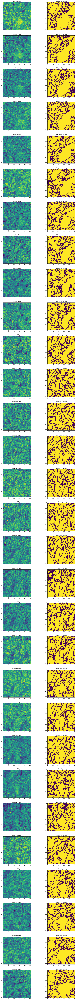

In [66]:
# 显示在测试集中的分割结果
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(30, 2)
fig.set_size_inches((16, 200))
for i in range(30):
    img = "data/test/" + str(i) + ".png"
    axes[i][0].imshow(mpimg.imread(img))
    axes[i][0].set_title(img)
    img = "data/test/" + str(i) + "_res.png"
    axes[i][1].imshow(mpimg.imread(img))
    axes[i][1].set_title(img)